<a href="https://colab.research.google.com/github/thy-hoang-nn/Online-Shopper-Analysis/blob/master/OnlineShopperPurchasing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
import os

drive.mount('/content/drive')
os.chdir('/content/drive/MyDrive/Kaggle/')

Mounted at /content/drive


# Import package

In [146]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
% matplotlib inline
from pandas_profiling import ProfileReport
import seaborn as sns
from matplotlib.gridspec import GridSpec
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split, GridSearchCV

from sklearn.model_selection import cross_val_score
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn import tree
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBRegressor

from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.preprocessing import RobustScaler



from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, \
confusion_matrix, f1_score, cohen_kappa_score, classification_report


from imblearn.over_sampling import SMOTE
from sklearn import metrics 
from sklearn.metrics import roc_auc_score
from sklearn.metrics import log_loss

from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.dummy import DummyClassifier
from warnings import filterwarnings
filterwarnings('ignore')



In [3]:
df= pd.read_csv("/content/drive/MyDrive/Kaggle/online_shoppers_intention.csv")
df

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3,3,1,4,Returning_Visitor,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4,6,1,1,Returning_Visitor,True,False
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3,2,1,8,Returning_Visitor,True,False
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3,2,1,13,Returning_Visitor,True,False
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,Nov,2,2,3,11,Returning_Visitor,False,False


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   12330 non-null  int64  
 14  TrafficType           

In [5]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

     - 16.3 MB 135 kB/s

ERROR: Operation cancelled by user


In [ ]:
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

1. High level understanding of data (look at columns, shape, null values)
2. Understand how to work with different question types (multiple answers and single answers)
3. Experiment with plotly basic and go
4. Go through my process to build more advanced graphs.
5. Start understanding the question "How do skilss vary across roles"

In [6]:
df.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


In [7]:
df.shape

(12330, 18)

In [8]:
df.describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,OperatingSystems,Browser,Region,TrafficType
count,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000
mean,2.315166,80.818611,0.503569,34.472398,31.731468,1194.746220,0.022191,0.043073,5.889258,0.061427,2.124006,2.357097,3.147364,4.069586
std,3.321784,176.779107,1.270156,140.749294,44.475503,1913.669288,0.048488,0.048597,18.568437,0.198917,0.911325,1.717277,2.401591,4.025169
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,0.000000,7.000000,184.137500,0.000000,0.014286,0.000000,0.000000,2.000000,2.000000,1.000000,2.000000
50%,1.000000,7.500000,0.000000,0.000000,18.000000,598.936905,0.003112,0.025156,0.000000,0.000000,2.000000,2.000000,3.000000,2.000000
75%,4.000000,93.256250,0.000000,0.000000,38.000000,1464.157214,0.016813,0.050000,0.000000,0.000000,3.000000,2.000000,4.000000,4.000000
max,27.000000,3398.750000,24.000000,2549.375000,705.000000,63973.522230,0.200000,0.200000,361.763742,1.000000,8.000000,13.000000,9.000000,20.000000


- In the first glance, we can see administrative_duration, informational_duration, productrelated_duration and pagevalue has the too extreme max that seems to be far from the rest of data (min =0)
- Exit rates and bounce rates

In [9]:
df['Revenue'].value_counts().plot(kind='bar')

Highly imbalanced. If we use this dataframe as the base of our predictive model, the model will be overfit as it will assume that most of customers will not make any transactions.

Project planning
- Understand nature of the data .info(), .describe()
- Histograms and boxplots
- Value counts
- missing values
- correlation between the metrics 
- Exploring interesting themes
- Feature Engineering
- Data processing or use a transformer: use label for train and test
- Scaling
- Feature selection
- Building model 
- Optimize model with gridsearchcv




Question: 
- Does customers comeback to the store if there are some special events occuring in that month?
- 

#Data Cleaning

##Handle missing values

In [10]:
total = df.isnull().sum().sort_values(ascending=False)
percent = (total*100/df.isnull().count()).sort_values(ascending=False)
res = pd.concat([total,percent], axis=1, keys=['Total','Percent'])
res

,Total,Percent
Administrative,0,0.0
Administrative_Duration,0,0.0
Weekend,0,0.0
VisitorType,0,0.0
TrafficType,0,0.0
Region,0,0.0
Browser,0,0.0
OperatingSystems,0,0.0
Month,0,0.0
SpecialDay,0,0.0


No missing values

In [11]:
df['Weekend'] = df['Weekend'].astype('int')
df['Revenue'] = df['Revenue'].astype('int')

# EDA

## Visualize distribition

In [5]:
cat_cols = df.select_dtypes(['object']).columns
num_cols= df.select_dtypes(['int64', 'float64']).columns

In [6]:
print("Total {} categories variables {}".format(len(cat_cols),cat_cols))
print("Total {} numerical variables {}".format(len(num_cols),num_cols))


Total 2 categories variables Index(['Month', 'VisitorType'], dtype='object')
Total 14 numerical variables Index(['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay',
       'OperatingSystems', 'Browser', 'Region', 'TrafficType'],
      dtype='object')


## Categorical features

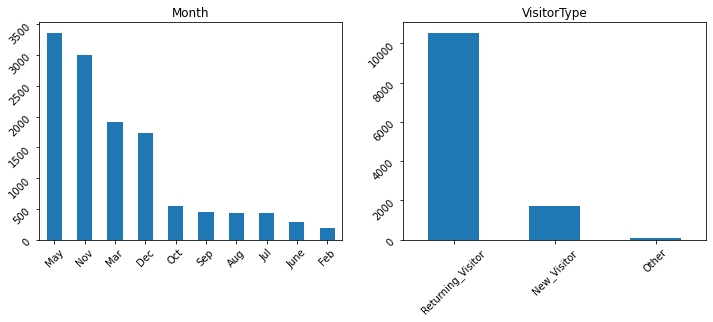

In [20]:
gs = GridSpec(11,4)
plt.figure(figsize=(25,60))
plt.subplots_adjust(wspace=0.2, hspace=0.4)
for i,col in enumerate(cat_cols):
  ax= plt.subplot(gs[i])
  df[col].value_counts().plot.bar()
  plt.xticks(rotation=45)
  plt.yticks(rotation=45)
  plt.title(col)


- May and Nov most active months (customers were active). 
- We are missing 2 months: January & April
- Returning visitors have the highest count.

###What months do most sales happen?

In [42]:
print('Number of month {}'.format(len(df['Month'].value_counts())))
df['Month'].value_counts()

Number of month 10


May     3364
Nov     2998
Mar     1907
Dec     1727
Oct      549
Sep      448
Aug      433
Jul      432
June     288
Feb      184
Name: Month, dtype: int64

Text(0, 0.5, 'Total revenue')

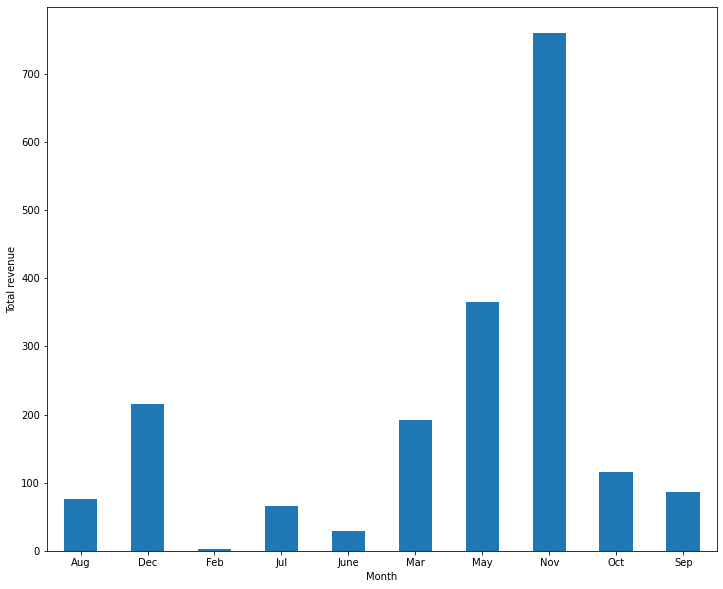

In [43]:
monthly_revenue = df.groupby(['Month'])[['Revenue']].agg('sum').unstack()
monthly_revenue.plot(kind='bar', figsize=(12,10))
plt.xticks(np.arange(10), sorted(df['Month'].unique()), rotation=0)
plt.xlabel('Month')
plt.ylabel("Total revenue")

- High revenue is in the month of November. Maybe it is because of black friday ???Showing that there are more visitors to visit the site these months.
- February has the least contribution in the revenue generation.
- As described previously, May has the highest number of visitors but the revenue generation is approaximately 52% more in November in comparison to May.


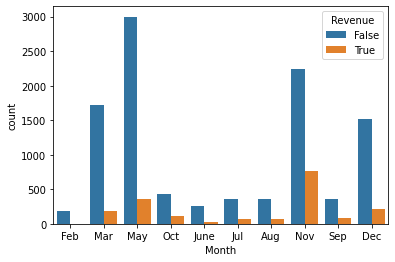

In [44]:
sns.countplot(x=df['Month'],data=df,hue='Revenue')

- Month of May, returning visitors, during the week, and not purchasing (Revenue = False) seems to be most frequent values.

In [24]:
df.groupby('VisitorType')['Revenue'].value_counts(normalize=True)

VisitorType        Revenue
New_Visitor        0          0.750885
                   1          0.249115
Other              0          0.811765
                   1          0.188235
Returning_Visitor  0          0.860677
                   1          0.139323
Name: Revenue, dtype: float64

Though the returning visitors corresponds to ~85% of the overall sessions, but the conversion rate of new visitors is (24.93 – 14.09) ~ 10% greater than the returning visitors.

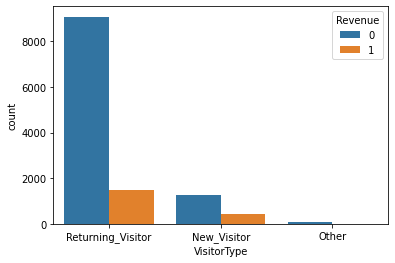

In [25]:
sns.countplot(x= df['VisitorType'],data=df, hue='Revenue')

It's evident that the majority of visitors to the site do not generate revenue (as to be expected)

### Which visitors generated revenue ?




(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 <a list of 10 Text major ticklabel objects>)

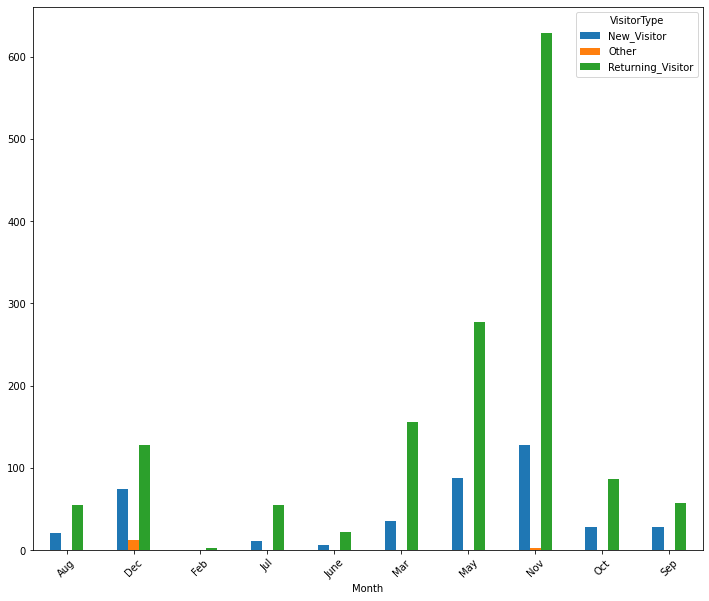

In [26]:
temp = df.groupby(['Month','VisitorType'])['Revenue'].agg('sum').unstack()
temp.plot(kind='bar',figsize=(12,10))
plt.xticks(rotation=45)


November is the month with the highest number of visitors (returning & new) 

## Numerical features

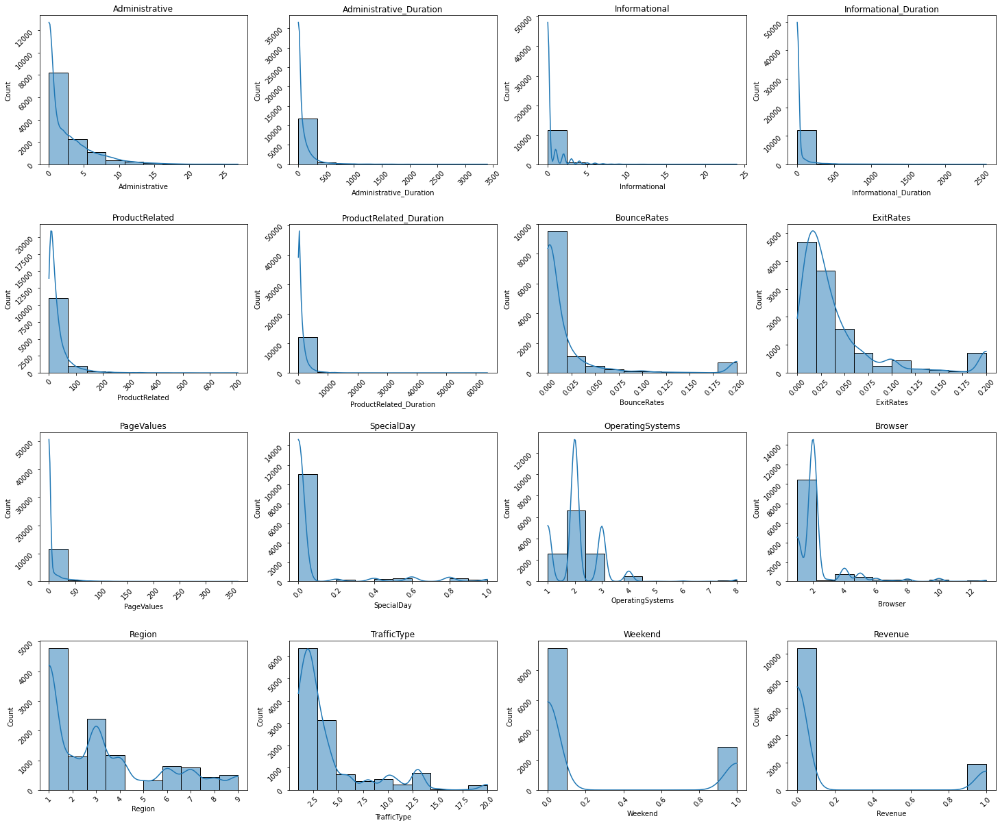

In [27]:
from pandas.core.arrays.period import raise_on_incompatible

gs = GridSpec(11,4)
plt.figure(figsize=(25,60))
plt.subplots_adjust(wspace=0.2, hspace=0.4)
for i,col in enumerate(num_cols):
  ax = plt.subplot(gs[i])
  sns.histplot(df[col], kde= True,bins=10)
  # sns.boxplot(x=col, hue=col, data=df, y='Revenue')
  plt.xticks(rotation=45)
  plt.yticks(rotation=45)
  plt.title(col)



- Most of numerical features has are skewed to the right
- Maybe they has outliners
- check outliners by using scatter plot

###Which days do customers prefer shopping online ?

Text(0, 0.5, 'count')

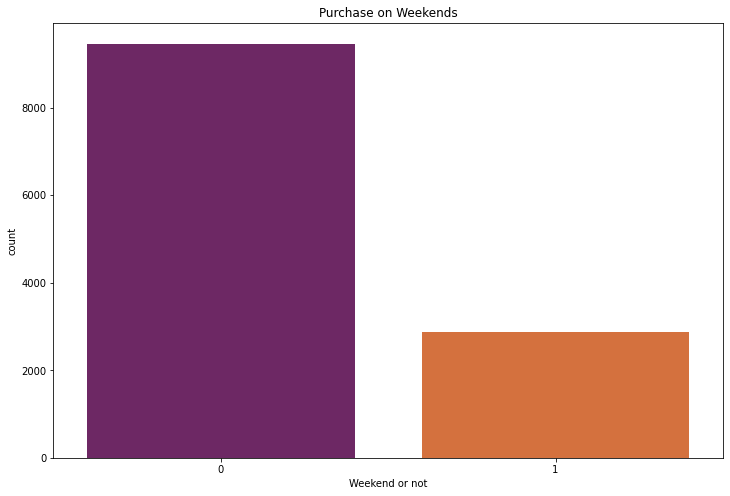

In [28]:
plt.figure(figsize=(12,8))
sns.countplot(df['Weekend'], palette = 'inferno')
plt.title('Purchase on Weekends')
plt.xlabel('Weekend or not')
plt.ylabel('count')



The count of users on weekdays is significant greater than on weekends. This may mean that people prefer to shop online when they do not have time to go out during weekdays and go out during weekends.

In [29]:
df.groupby('Weekend')['Revenue'].value_counts(normalize=True)

Weekend  Revenue
0        0          0.851089
         1          0.148911
1        0          0.826011
         1          0.173989
Name: Revenue, dtype: float64

It seems like customers/visitors like to shop on non-weekends more in comparison to weekends. 
But revenue conversion is slightly higher on weekends.

### Do operating systems play a role on Revenue generation?

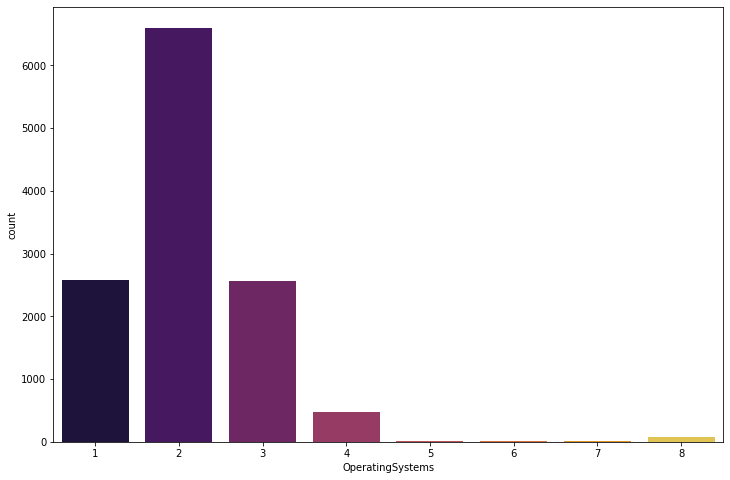

In [30]:
plt.figure(figsize=(12,8))
sns.countplot(df['OperatingSystems'], palette = 'inferno')


Most visitors are having OS types 2,1,3 respectively. 

In [31]:
df.groupby('OperatingSystems')['Revenue'].value_counts(normalize=True)

OperatingSystems  Revenue
1                 0          0.853385
                  1          0.146615
2                 0          0.825027
                  1          0.174973
3                 0          0.895108
                  1          0.104892
4                 0          0.822176
                  1          0.177824
5                 0          0.833333
                  1          0.166667
6                 0          0.894737
                  1          0.105263
7                 0          0.857143
                  1          0.142857
8                 0          0.784810
                  1          0.215190
Name: Revenue, dtype: float64

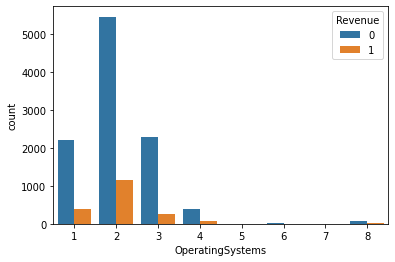

In [32]:
sns.countplot(x= df['OperatingSystems'],data=df, hue='Revenue')

- Conversion rate is high on OS type 2 in comparison with type 1 and 3.
- There is a very strong skew to the right, with Operating Systems 5,6,7 and 8 having less than 1% of prevalence.

In [7]:
df["OperatingSystems_agg"] = df["OperatingSystems"].apply(lambda x: "other" if x >=4 else x)
display(100*df["OperatingSystems_agg"].value_counts()/df.shape[0])

2        53.536091
1        20.965126
3        20.721817
other     4.776967
Name: OperatingSystems_agg, dtype: float64

### What is the distribution of browsers in the dataset?

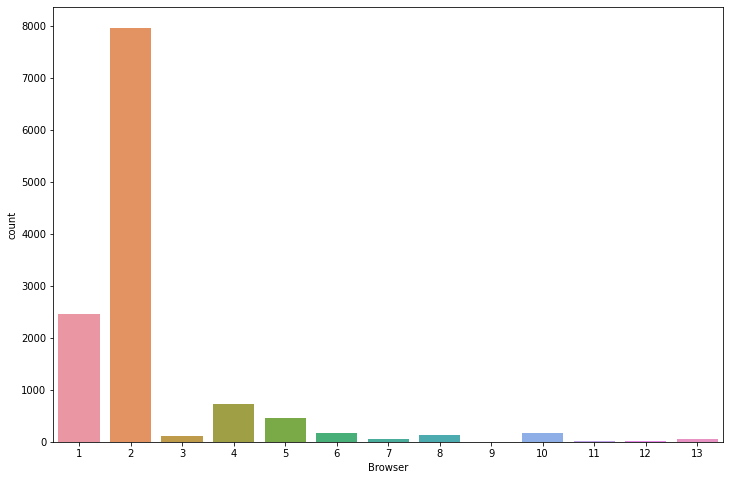

In [27]:
plt.figure(figsize=(12,8))
sns.countplot(df['Browser'])

The customers/visitors are using Browser type 2 and 1 respectively. Apart from browser type 4 and 5, all other browsers have very less usage rate. 

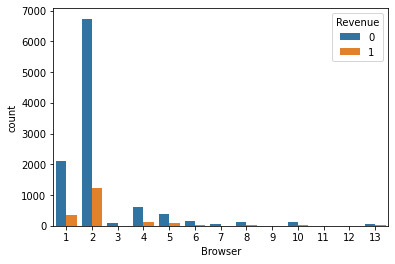

In [35]:
sns.countplot(x= df['Browser'],data=df, hue='Revenue')

Browser type 2 has a contribution of 10% in revenue generation overall.

In [8]:
df["Browser_agg"] = df["Browser"].apply(lambda x: "other" if x not in [1,2,4] else x)
display(pd.DataFrame(100*df["Browser_agg"].value_counts()/df.shape[0]))

,Browser_agg
2,64.566099
1,19.967559
other,9.497161
4,5.969181


###Do Browser and Operating system have a strong association as well?

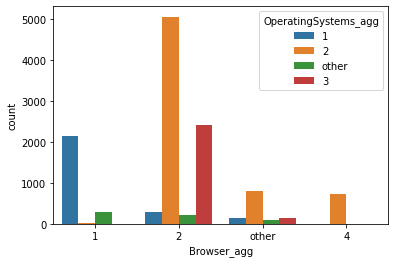

In [29]:
g = sns.countplot(x=df["Browser_agg"], data=df, hue="OperatingSystems_agg")


- Customers are having OS type 2 which prefers using browser 2

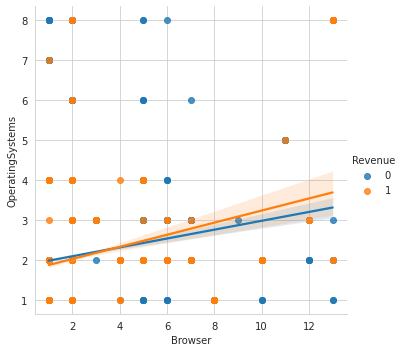

In [38]:
sns.set_style('whitegrid')
sns.lmplot('Browser','OperatingSystems',hue='Revenue', data=df)
plt.show()

Operating System and Browser are positively correlated.

### What region do customers come from?

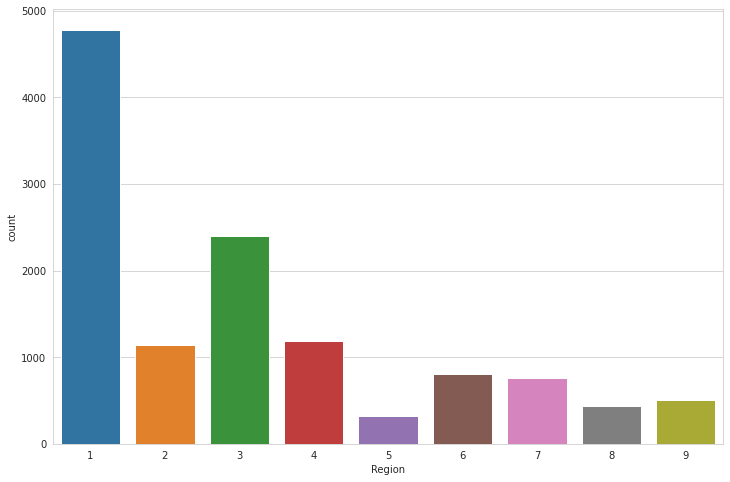

In [39]:
plt.figure(figsize=(12,8))
sns.countplot(df['Region'])

The region with the most visitors is region 1 - but we don't know where exactly that is. But maybe if you were in charge of these data you would.

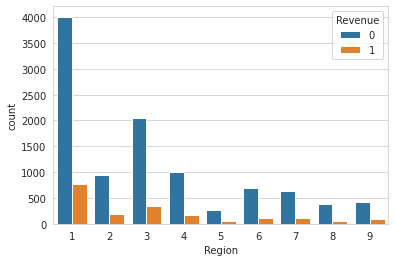

In [40]:
sns.countplot(x=df['Region'],data=df,hue='Revenue')

Customers are from region 1, 3, 4, and 2 respectively and only customers from region 1 and 3 are contributing maximum in revenue generation. More efforts needs to be made in the region 2 and 4 to increase the revenue generation.

### Which traffic type do customer prefer using?

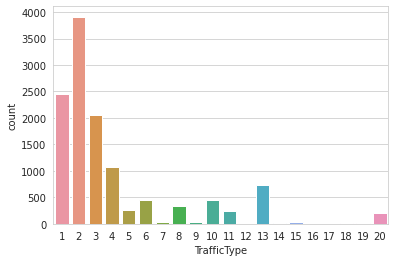

In [41]:
sns.countplot(df['TrafficType'], data=df)

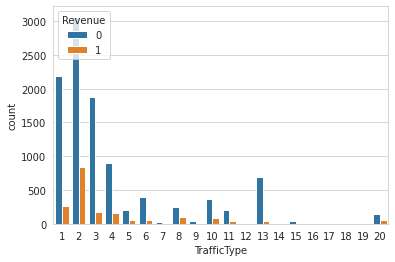

In [42]:
sns.countplot(x=df['TrafficType'],data=df,hue='Revenue')

- The traffic generation is via Traffic Types 2, 1, 3, 4, and 13 respectively. 
Overall, Traffic Type 2 has contributed more in the revenue generation w.r.t other traffic types.
- Also, Traffic Types 12, 15, 17 and 18 has zero contribution in revenue generation. The company must look up what these traffic types corresponds to in real terms so that either they can improve the digital marketing if it corresponds to ads, social media etc. or ignore it if it is coming from something non-relevant.

### What special day attracts more new users? Which months have many special days?

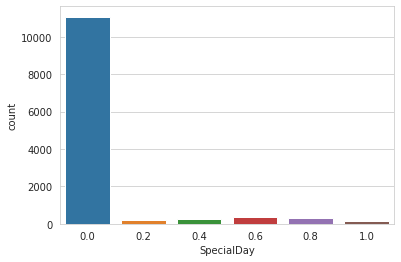

In [43]:
sns.countplot(x=df['SpecialDay'])

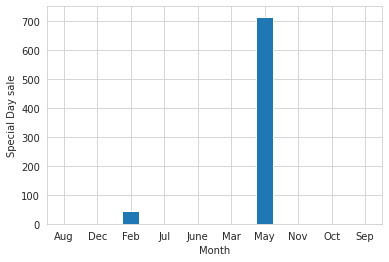

In [44]:
#the distribution of special days

specialday = df.groupby(['Month'])[['SpecialDay']].agg('sum').unstack()
specialday.plot(kind='bar')
plt.xticks(np.arange(10), sorted(df['Month'].unique()), rotation=0)
plt.xlabel("Month")
plt.ylabel("Special Day sale")
plt.show()

The special day feature is only present in the months of February and May.

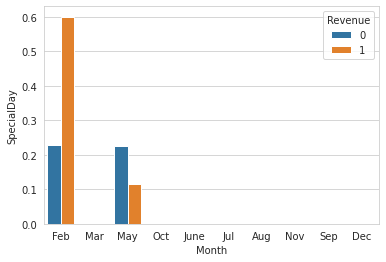

In [45]:
sns.barplot(df['Month'],df['SpecialDay'],data=df, hue='Revenue',ci=None)

Special day only accounts for in the month of February and May.

In [ ]:
df_num = df[['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay',
       'OperatingSystems', 'Browser', 'Region', 'TrafficType']]
df_cat =df[['Month', 'VisitorType']]

In [ ]:
correlation = df.corr()
top_feature = correlation[abs(correlation > 0.5)].index

# sns.heatmap(df_num[top_feature].corr(), annot=True, cmap=sns.diverging_palette(20,220, n=200))
print(top_feature)

Index(['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay',
       'OperatingSystems', 'Browser', 'Region', 'TrafficType', 'Weekend',
       'Revenue'],
      dtype='object')


## Page metrics

- Bounce rates: Percentage of people who enter the site and leave without triggering any other requests to the analytics server.
- Exit rate: percentage where that page was the last page visited in the session, out of all visits to that page.

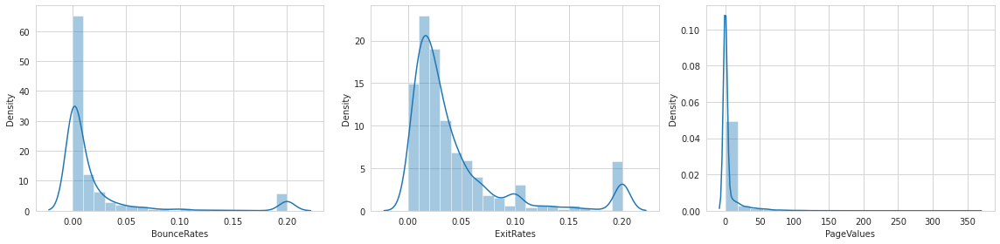

In [46]:
fig = plt.figure(figsize=(16, 4))

ax1 = fig.add_subplot(1, 3, 1)
ax2 = fig.add_subplot(1, 3, 2)
ax3 = fig.add_subplot(1, 3, 3)

sns.distplot(df['BounceRates'], bins=20, ax=ax1)
sns.distplot(df['ExitRates'], bins=20, ax=ax2)
sns.distplot(df['PageValues'], bins=20, ax=ax3)

plt.tight_layout()
plt.show()

- BounceRates and PageValue do not follow a normal distribution.
- All 3 features have distributions that are skewed right.
- All 3 features have outliners.


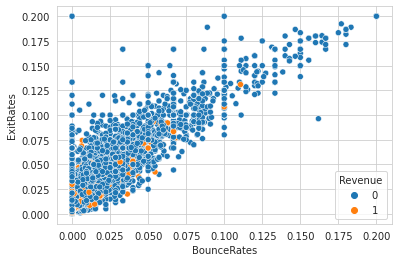

In [47]:
sns.scatterplot(x='BounceRates',y ='ExitRates',data=df, hue='Revenue')

- We see that there is a good linear relationship
- Outliers observations indicate Revenue false
- Revenue True seems more concentrated between 0 - 0.1
- Revenue false has much more observations
- Outliers might be important to determine whether the  revenue will be false
- Higher exit and bounce rates might mean a higher probability that the revenue will be false.
- Exit rate has more high values than bounce rate, which makes sense, where transaction confirmation pages for example will cause the average exit rate to increase.
- Binning based on a certain thershold of these values might improve the modeling results
- Less linear (but still correlated)


=> Lots of outliners which are significant in the model's result so we do not need to remove them. 
- Combine the two features with average and weighted average and observe if they display a better relationship.

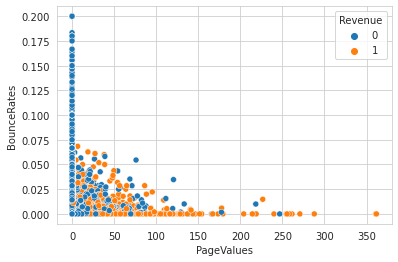

In [48]:
sns.scatterplot(x='PageValues',y='BounceRates',data=df,hue='Revenue')

- Good non-linear relationship
- While there a many Page values and Bounce rates observations concentrated in certain area it seems that almost all page values extreme values translate into revenue true and bounce rate extremes into revenue false.
- its like the two extremes have a negative relationship to the target variable.
- If bounce rates 0 - 0.07 and page values (all?) then higher chance the revenue will be true
- It appears that higher page values have lower bounce rates

=> Outliners are important so we do not remove them. Creata a new feature by dividing the two (then there are no more outliners)

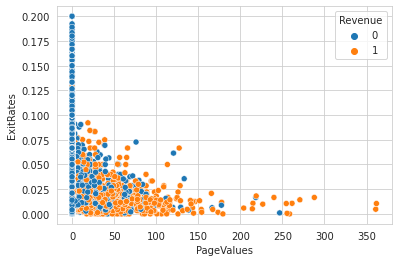

In [49]:
sns.scatterplot(x='PageValues',y='ExitRates',data=df, hue='Revenue')

- Strong non-liner realtionship
- It seems if exit rates are between 0 - 0.1 and page values 0 - max there is a higher chance that the revenue will be TRUE.
=> Same as bouncerates

Summary:
- Bounce Rates and Exit values have a high correlation
- Bounce Rates have strong predictive power for target variable
- PageValue have strong predictive power for target variable
- Page x Bounce Rates have strong predictive power for target variable

## Administrative, Informational and ProductRelated features

### What are average values of numerical features for users likely to make a transaction?

In [50]:
df[df['Revenue'] == 1].mean()

Administrative                3.393606
Administrative_Duration     119.483244
Informational                 0.786164
Informational_Duration       57.611427
ProductRelated               48.210168
ProductRelated_Duration    1876.209615
BounceRates                   0.005117
ExitRates                     0.019555
PageValues                   27.264518
SpecialDay                    0.023166
OperatingSystems              2.092767
Browser                       2.453354
Region                        3.082285
TrafficType                   4.021488
Weekend                       0.261530
Revenue                       1.000000
dtype: float64

- Average time spent by user on Product Pages is 1876.209615.

- Average time spent by user on Administrative Pages is 119.483244.

- Average time spent by user on Informational Pages is 57.11427.- 

In [51]:
df[df['Revenue'] == 0].mean()

Administrative                2.117732
Administrative_Duration      73.740111
Informational                 0.451833
Informational_Duration       30.236237
ProductRelated               28.714642
ProductRelated_Duration    1069.987809
BounceRates                   0.025317
ExitRates                     0.047378
PageValues                    1.975998
SpecialDay                    0.068432
OperatingSystems              2.129726
Browser                       2.339474
Region                        3.159278
TrafficType                   4.078392
Weekend                       0.227308
Revenue                       0.000000
dtype: float64

Visitors who had spent more average duration on any of the page types are likely to make a transaction.

### How many customers goto admin pages and end with a purchase?

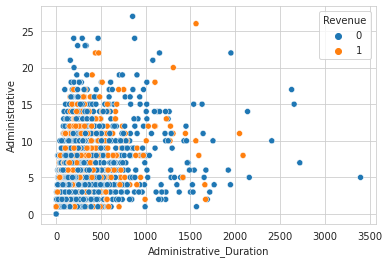

In [52]:
sns.scatterplot(x='Administrative_Duration', data=df, y="Administrative", hue="Revenue")

The number of visits to an administration page is significantly different for each group.

### Does the time spent on admin pages have an effect as well?

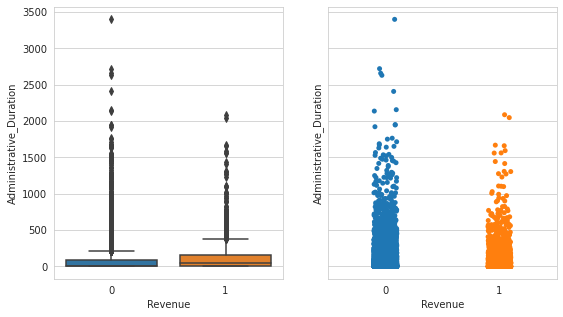

In [53]:
f, ax = plt.subplots(1,2,figsize=(9,5), sharey=True)
g = sns.boxplot(y="Administrative_Duration", x="Revenue", data=df, ax=ax[0])
g = sns.stripplot( y="Administrative_Duration", x="Revenue", data=df, ax=ax[1])


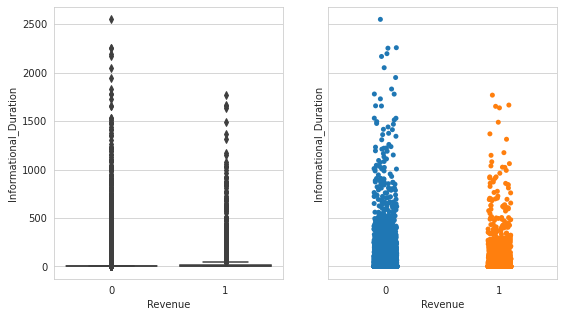

In [54]:
f, ax = plt.subplots(1,2,figsize=(9,5), sharey=True)
g = sns.boxplot(y="Informational_Duration", x="Revenue", data=df, ax=ax[0])
g = sns.stripplot( y="Informational_Duration", x="Revenue", data=df, ax=ax[1])

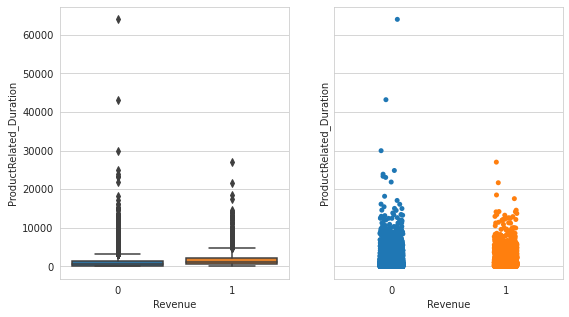

In [55]:
f, ax = plt.subplots(1,2,figsize=(9,5), sharey=True)
g = sns.boxplot(y="ProductRelated_Duration", x="Revenue", data=df, ax=ax[0])
g = sns.stripplot( y="ProductRelated_Duration", x="Revenue", data=df, ax=ax[1])

The number of product related pages, and the time spent on them, is way higher than that for account related or informational pages.

Multivariate Analysis

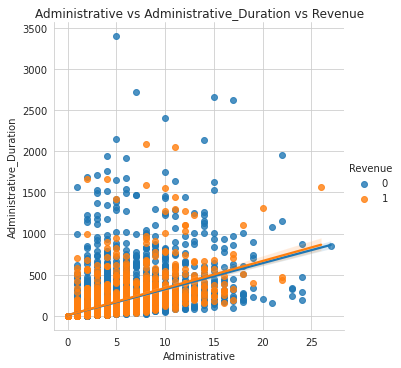

In [56]:
sns.lmplot('Administrative', 'Administrative_Duration', hue='Revenue', data=df)
plt.title("Administrative vs Administrative_Duration vs Revenue")
plt.show()

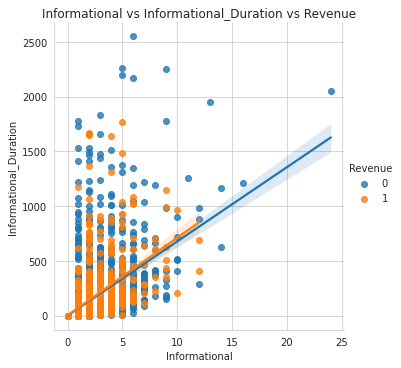

In [ ]:
sns.lmplot('Informational', 'Informational_Duration', hue='Revenue', data=df)
plt.title("Informational vs Informational_Duration vs Revenue")
plt.show()

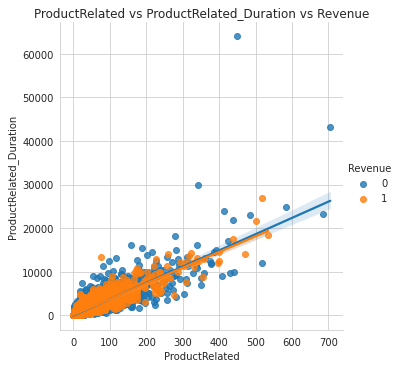

In [57]:
sns.lmplot('ProductRelated', 'ProductRelated_Duration', hue='Revenue', data=df)
plt.title("ProductRelated vs ProductRelated_Duration vs Revenue")
plt.show()

- Even though customers/visitors have spent a large amount of time on product related pages but the revenue generation is very low. There are certain outliers who did spent more than 30000 seconds (approx. 8 Hours) but still didn’t make any transaction.
- Administrative Pages and Administrative Duration, Informational and Informational Duration, Product Related and Product Related Duration are positively correlated.
- On administrative pages 2 to 15 such as login, logout, password recovery, profile, email wish list etc., visitors have spent more than 500 seconds (approx. 8 minutes) which is generally quite higher than normal. It suggests that visitors are having trouble logging in or it’s taking too much time to process the request.

### What is the effect of all page visits on Revenue?
If all three kinds of page visits show significant difference on Revenue, can a combined feature create a stronger effect?

In [9]:
df["AllPageCount"] = df["Administrative"] + df["Informational"] + df["ProductRelated"]
df["AllPageCount_Duration"] = df["Administrative_Duration"] + df["Informational_Duration"] + df["ProductRelated_Duration"]

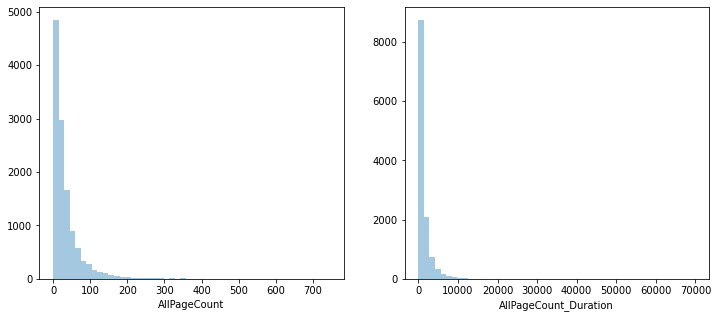

In [12]:
f, ax = plt.subplots(1,2,figsize=(12,5))
g = sns.distplot(a=df["AllPageCount"], ax=ax[0], kde=False)
g = sns.distplot(a=df["AllPageCount_Duration"], ax=ax[1], kde=False)

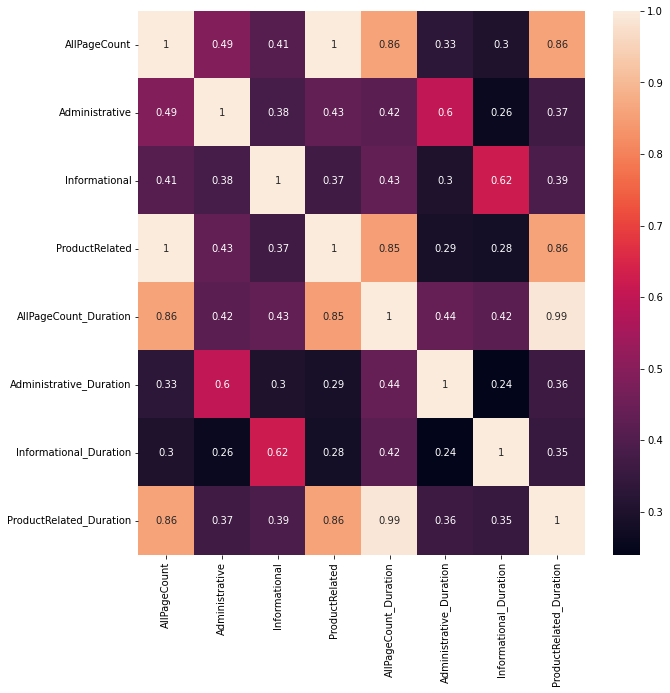

In [13]:
cols= ["AllPageCount", 
       "Administrative", "Informational", "ProductRelated", 
       "AllPageCount_Duration", 
       "Administrative_Duration", "Informational_Duration", "ProductRelated_Duration"]
f, ax = plt.subplots(1,1,figsize=(10,10))
sns.heatmap(np.round(df[cols].corr(), 2), ax=ax, annot=True)

There are strong correlations here. It may be prudent to remove some features while modeling

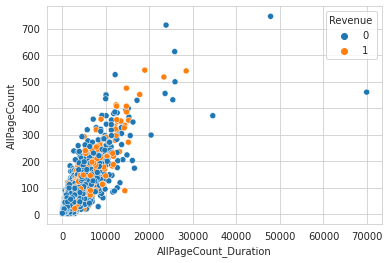

In [60]:
sns.scatterplot(x='AllPageCount_Duration', y ='AllPageCount', data=df, hue='Revenue')

Summary:
- Features such as "Informational" and "ProductRelated" appear to have strong predictive power.
- Two new features were created here: AllPageCount & AllPageCount_Duration

In [61]:
correlation =df.corr()['Revenue'].sort_values()

print(correlation.head(10),'\n')

print(correlation.tail(10))

ExitRates                 -0.207071
BounceRates               -0.150673
SpecialDay                -0.082305
OperatingSystems          -0.014668
Region                    -0.011595
TrafficType               -0.005113
Browser                    0.023984
Weekend                    0.029295
Informational_Duration     0.070345
Administrative_Duration    0.093587
Name: Revenue, dtype: float64 

Informational_Duration     0.070345
Administrative_Duration    0.093587
Informational              0.095200
Administrative             0.138917
ProductRelated_Duration    0.152373
AllPageCount_Duration      0.156068
ProductRelated             0.158538
AllPageCount               0.164110
PageValues                 0.492569
Revenue                    1.000000
Name: Revenue, dtype: float64


# Feature Engineering

In [14]:
df['SpecialDay'] = df['SpecialDay'].astype('category')

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 22 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   Administrative           12330 non-null  int64   
 1   Administrative_Duration  12330 non-null  float64 
 2   Informational            12330 non-null  int64   
 3   Informational_Duration   12330 non-null  float64 
 4   ProductRelated           12330 non-null  int64   
 5   ProductRelated_Duration  12330 non-null  float64 
 6   BounceRates              12330 non-null  float64 
 7   ExitRates                12330 non-null  float64 
 8   PageValues               12330 non-null  float64 
 9   SpecialDay               12330 non-null  category
 10  Month                    12330 non-null  object  
 11  OperatingSystems         12330 non-null  int64   
 12  Browser                  12330 non-null  int64   
 13  Region                   12330 non-null  int64   
 14  Traffi

In [16]:
# create new features
traffic_type_pct = 100*df["TrafficType"].value_counts().to_frame()/df.shape[0]
traffic_idx_list = traffic_type_pct[traffic_type_pct["TrafficType"] >= 2].index
df['TrafficType_agg'] = df['TrafficType'].apply(lambda x: x if x in traffic_idx_list else "other")

In [17]:
df['PageValues_x_BounceRates'] = df['PageValues'] * df['BounceRates']

In [68]:
# import calendar
# months = [calendar.month_name[i][:3] for i in range(1,13)]
# months[5] = "June"
# train_data["quarter"] = train_data["Month"].apply(lambda x: 1+np.floor(months.index(x)/3)).astype(np.uint8)

## Removing correlated numerical features

In [18]:
df2= df.copy()

In [19]:
numerical_cols = ["Administrative", "Administrative_Duration", 
                  "Informational", "Informational_Duration",
                  "ProductRelated", "ProductRelated_Duration", 
                  "BounceRates", "ExitRates", "PageValues", "SpecialDay",
                  "AllPageCount", "AllPageCount_Duration", "PageValues_x_BounceRates"]

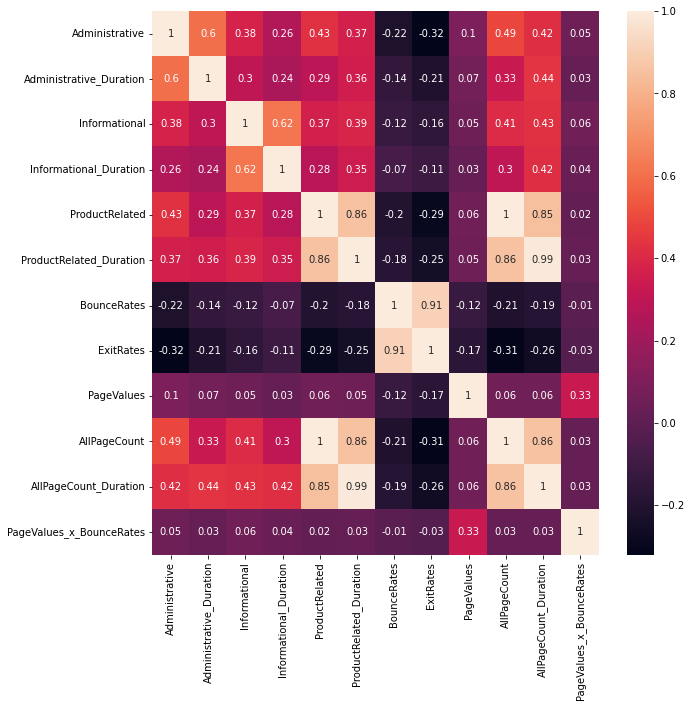

In [20]:
f, ax = plt.subplots(1,1,figsize=(10,10))
sns.heatmap(np.round(df[numerical_cols].corr(), 2), ax=ax, annot=True)

Drop columns that have a high correlation with other features.

In [21]:
drop_cols = ["Administrative_Duration","Informational_Duration","ProductRelated_Duration", 
             "AllPageCount", "AllPageCount_Duration", "ExitRates"]

for i in drop_cols:
  if i in df2.columns:
    df2.drop(i, axis=1, inplace=True)

In [22]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   Administrative            12330 non-null  int64   
 1   Informational             12330 non-null  int64   
 2   ProductRelated            12330 non-null  int64   
 3   BounceRates               12330 non-null  float64 
 4   PageValues                12330 non-null  float64 
 5   SpecialDay                12330 non-null  category
 6   Month                     12330 non-null  object  
 7   OperatingSystems          12330 non-null  int64   
 8   Browser                   12330 non-null  int64   
 9   Region                    12330 non-null  int64   
 10  TrafficType               12330 non-null  int64   
 11  VisitorType               12330 non-null  object  
 12  Weekend                   12330 non-null  bool    
 13  Revenue                   12330 non-null  bool

In [23]:
df2.head(10)

,Administrative,Informational,ProductRelated,BounceRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,OperatingSystems_agg,Browser_agg,TrafficType_agg,PageValues_x_BounceRates
0,0,0,1,0.200000,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False,1,1,1,0.0
1,0,0,2,0.000000,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False,2,2,2,0.0
2,0,0,1,0.200000,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False,other,1,3,0.0
3,0,0,2,0.050000,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False,3,2,4,0.0
4,0,0,10,0.020000,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False,3,other,4,0.0
5,0,0,19,0.015789,0.0,0.0,Feb,2,2,1,3,Returning_Visitor,False,False,2,2,3,0.0
6,0,0,1,0.200000,0.0,0.4,Feb,2,4,3,3,Returning_Visitor,False,False,2,4,3,0.0
7,1,0,0,0.200000,0.0,0.0,Feb,1,2,1,5,Returning_Visitor,True,False,1,2,5,0.0
8,0,0,2,0.000000,0.0,0.8,Feb,2,2,2,3,Returning_Visitor,False,False,2,2,3,0.0
9,0,0,3,0.000000,0.0,0.4,Feb,2,4,1,2,Returning_Visitor,False,False,2,4,2,0.0


In [24]:
drop_cols = ["OperatingSystems", "Browser", "Browser_agg", "Region", "TrafficType"]
for c in drop_cols:
    if c in df2.columns:
        df2.drop(c, inplace=True, axis=1)

In [25]:
df2.head(10)

,Administrative,Informational,ProductRelated,BounceRates,PageValues,SpecialDay,Month,VisitorType,Weekend,Revenue,OperatingSystems_agg,TrafficType_agg,PageValues_x_BounceRates
0,0,0,1,0.200000,0.0,0.0,Feb,Returning_Visitor,False,False,1,1,0.0
1,0,0,2,0.000000,0.0,0.0,Feb,Returning_Visitor,False,False,2,2,0.0
2,0,0,1,0.200000,0.0,0.0,Feb,Returning_Visitor,False,False,other,3,0.0
3,0,0,2,0.050000,0.0,0.0,Feb,Returning_Visitor,False,False,3,4,0.0
4,0,0,10,0.020000,0.0,0.0,Feb,Returning_Visitor,True,False,3,4,0.0
5,0,0,19,0.015789,0.0,0.0,Feb,Returning_Visitor,False,False,2,3,0.0
6,0,0,1,0.200000,0.0,0.4,Feb,Returning_Visitor,False,False,2,3,0.0
7,1,0,0,0.200000,0.0,0.0,Feb,Returning_Visitor,True,False,1,5,0.0
8,0,0,2,0.000000,0.0,0.8,Feb,Returning_Visitor,False,False,2,3,0.0
9,0,0,3,0.000000,0.0,0.4,Feb,Returning_Visitor,False,False,2,2,0.0


In [52]:
temp = pd.get_dummies(df2, drop_first=True)
temp.head(10)

,Administrative,Informational,ProductRelated,BounceRates,PageValues,Weekend,Revenue,PageValues_x_BounceRates,SpecialDay_0.2,SpecialDay_0.4,...,TrafficType_agg_2,TrafficType_agg_3,TrafficType_agg_4,TrafficType_agg_5,TrafficType_agg_6,TrafficType_agg_8,TrafficType_agg_10,TrafficType_agg_11,TrafficType_agg_13,TrafficType_agg_other
0,0,0,1,0.200000,0.0,False,False,0.0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,2,0.000000,0.0,False,False,0.0,0,0,...,1,0,0,0,0,0,0,0,0,0
2,0,0,1,0.200000,0.0,False,False,0.0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,0,0,2,0.050000,0.0,False,False,0.0,0,0,...,0,0,1,0,0,0,0,0,0,0
4,0,0,10,0.020000,0.0,True,False,0.0,0,0,...,0,0,1,0,0,0,0,0,0,0
5,0,0,19,0.015789,0.0,False,False,0.0,0,0,...,0,1,0,0,0,0,0,0,0,0
6,0,0,1,0.200000,0.0,False,False,0.0,0,1,...,0,1,0,0,0,0,0,0,0,0
7,1,0,0,0.200000,0.0,True,False,0.0,0,0,...,0,0,0,1,0,0,0,0,0,0
8,0,0,2,0.000000,0.0,False,False,0.0,0,0,...,0,1,0,0,0,0,0,0,0,0
9,0,0,3,0.000000,0.0,False,False,0.0,0,1,...,1,0,0,0,0,0,0,0,0,0


## Encoding Categorical Features

In [47]:
df_temp=df2.copy()

In [59]:
df_temp['Weekend'] = df_temp['Weekend'].astype(int)
df_temp['Revenue'] = df_temp['Revenue'].astype(int)

In [60]:
cat_cols = ['Month',	'VisitorType','OperatingSystems_agg',	'TrafficType_agg']
for i in cat_cols:
  df_temp[cat_cols]= df_temp[cat_cols].astype(str)
labelencoder= LabelEncoder()
for i in cat_cols:
  if i in df_temp.columns:
    df_temp[i] = labelencoder.fit_transform(df_temp[i])


In [61]:
ohe = OneHotEncoder(handle_unknown='ignore')
for i in cat_cols:
  if i in df_temp.columns:
    df_temp[i] = ohe.fit_transform(df_temp[[i]]).toarray()

In [62]:
df_temp = pd.get_dummies(df_temp,drop_first=True)

In [63]:
df_temp.tail(10)

,Administrative,Informational,ProductRelated,BounceRates,PageValues,Month,VisitorType,Weekend,Revenue,OperatingSystems_agg,TrafficType_agg,PageValues_x_BounceRates,SpecialDay_0.2,SpecialDay_0.4,SpecialDay_0.6,SpecialDay_0.8,SpecialDay_1.0
12320,0,0,8,0.014286,0.000000,0.0,0.0,0,0,0.0,1.0,0.000000,0,0,0,0,0
12321,0,0,6,0.200000,0.000000,0.0,0.0,0,0,1.0,1.0,0.000000,0,0,0,0,0
12322,6,0,22,0.000000,0.000000,0.0,0.0,0,0,0.0,0.0,0.000000,0,0,0,0,0
12323,2,0,44,0.000000,0.000000,0.0,0.0,0,0,0.0,0.0,0.000000,0,0,0,0,0
12324,0,1,16,0.000000,0.000000,0.0,0.0,0,0,0.0,1.0,0.000000,0,0,0,0,0
12325,3,0,53,0.007143,12.241717,0.0,0.0,1,0,0.0,1.0,0.087441,0,0,0,0,0
12326,0,0,5,0.000000,0.000000,0.0,0.0,1,0,0.0,0.0,0.000000,0,0,0,0,0
12327,0,0,6,0.083333,0.000000,0.0,0.0,1,0,0.0,0.0,0.000000,0,0,0,0,0
12328,4,0,15,0.000000,0.000000,0.0,0.0,0,0,0.0,0.0,0.000000,0,0,0,0,0
12329,0,0,3,0.000000,0.000000,0.0,1.0,1,0,0.0,0.0,0.000000,0,0,0,0,0


# Split Dataset

In [150]:
X = df_temp.drop('Revenue', axis=1)
y = df_temp['Revenue']

In [151]:
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [152]:
print("x_train Shape:",x_train.shape)
print("y_train Shape:",y_train.shape)
print("x_test Shape:",x_test.shape)
print("y_test Shape:",y_test.shape)

x_train Shape: (8631, 16)
y_train Shape: (8631,)
x_test Shape: (3699, 16)
y_test Shape: (3699,)


In [153]:
rs = RobustScaler()
x_train_scaled = pd.DataFrame(rs.fit_transform(x_train), columns=x_train.columns)
x_test_scaled = pd.DataFrame(rs.transform(x_test), columns=x_test.columns)

# Oversampling dataset

In [114]:
# Smote - oversampling
def smotify(x_train, y_train):
  smt = SMOTE()
  return smt.fit_resample(x_train, y_train)

#Building Model

## Logistic Regression with SMOTE split data

In [115]:
logreg = LogisticRegression(solver='lbfgs')
score = cross_val_score(logreg, x_train_scaled, y_train, cv=10, n_jobs=-1, scoring='f1').mean()
print(round(score,5))

0.50008


In [116]:
logreg = LogisticRegression(solver='lbfgs')
x_smote, y_smote = smotify(x_train_scaled,y_train)
y_pred = logreg.fit(x_smote,y_smote).predict(x_test_scaled)
y_prob_log = logreg.predict_proba(x_test_scaled)[:,1]

The area under the ROC curve is: 0.89


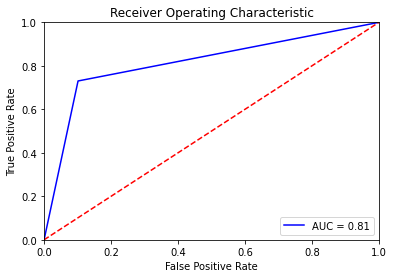

In [117]:
# Calculate ROC AUC for our best performing classifier, the Random Forest Classifier
roc_value = roc_auc_score(y_test, y_prob_log)
print('The area under the ROC curve is:', round(roc_value,2))

fpr, tpr, threshold = metrics.roc_curve(y_test, y_pred)
roc_auc = metrics.auc(fpr, tpr)

# Plotting ROC Curve
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()


In [118]:
# Calculate Log Loss
rfc_log_loss = log_loss(y_pred, y_prob_log, eps=1e-15)
print('Log Loss:', round(rfc_log_loss,2))

Log Loss: 0.27


In [119]:
Metrics = pd.DataFrame({'Accuracy': round(accuracy_score(y_test, y_pred),5) ,
              'Precision': round(precision_score(y_test, y_pred),5), 
              'Recall': round(recall_score(y_test, y_pred),5),
              'F1 Score': round(f1_score(y_test, y_pred),5),
              'ROC_AUC_Score': round(roc_auc_score(y_test, y_pred),5),
              'Cohen-Kappa Score':round(cohen_kappa_score(y_test, y_pred),5)}, index=['Logistic Regression'])

Metrics

,Accuracy,Precision,Recall,F1 Score,ROC_AUC_Score,Cohen-Kappa Score
Logistic Regression,0.8724,0.56988,0.73043,0.64024,0.81448,0.56412


In [120]:
round(f1_score(y_test, y_pred),5)

0.64024

In [121]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.95      0.90      0.92      3124
           1       0.57      0.73      0.64       575

    accuracy                           0.87      3699
   macro avg       0.76      0.81      0.78      3699
weighted avg       0.89      0.87      0.88      3699



## Random Forest

In [128]:
x,y = smotify(x_train, y_train)

print('Shape of x_train after smote: ', x.shape)
print('Shape of x_test after smote: ', x_test.shape)

#modeling

rand = RandomForestClassifier()
rand.fit(x,y)

y_pred_rfc = rand.predict(x_test)
y_prob_rfc = rand.predict_proba(x_test)[:,1]
print(classification_report(y_test,y_pred))

Shape of x_train after smote:  (14596, 16)
Shape of x_test after smote:  (3699, 16)
              precision    recall  f1-score   support

           0       0.95      0.90      0.92      3124
           1       0.57      0.73      0.64       575

    accuracy                           0.87      3699
   macro avg       0.76      0.81      0.78      3699
weighted avg       0.89      0.87      0.88      3699



In [124]:
print('Random Forest Classifier model accuracy(in %):', round(metrics.accuracy_score(y_test, y_pred_rfc)*100,2))

Random Forest Classifier model accuracy(in %): 87.54


The area under the ROC curve is: 0.89


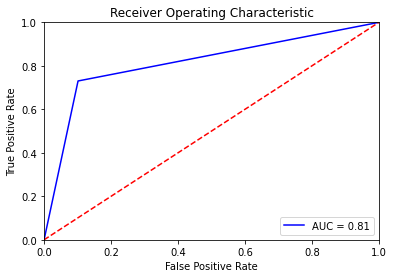

In [125]:
# Calculate ROC AUC for our best performing classifier, the Random Forest Classifier
roc_value = roc_auc_score(y_test, y_prob_rfc)
print('The area under the ROC curve is:', round(roc_value,2))

fpr, tpr, threshold = metrics.roc_curve(y_test, y_pred)
roc_auc = metrics.auc(fpr, tpr)

# Plotting ROC Curve
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [126]:
rfc_log_loss = log_loss(y_pred_rfc, y_prob_rfc, eps = 1e-5)
print('Log loss = ', round(rfc_log_loss,2))

Log loss =  0.12


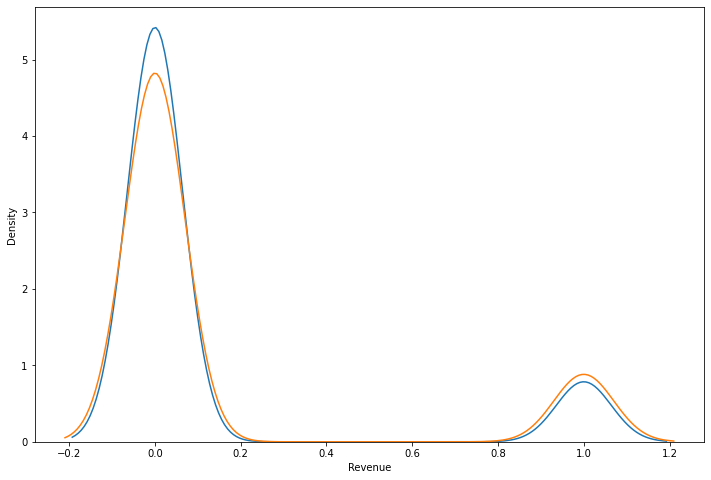

In [109]:
plt.figure(figsize=(12,8))
sns.distplot(y_pred_rfc, label='Predicted', hist=False)
sns.distplot(y_test, label='Actual',hist=False)
plt.show()

## Feature Importance

In [133]:
importances = rand.feature_importances_

std = np.std([tree.feature_importances_ for tree in rand.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

print("Feature ranking:")

for f in range(x_train.shape[1]):
    print("%d. Feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

Feature ranking:
1. Feature 4 (0.417721)
2. Feature 2 (0.117746)
3. Feature 3 (0.099229)
4. Feature 10 (0.094147)
5. Feature 6 (0.060773)
6. Feature 8 (0.055772)
7. Feature 0 (0.054975)
8. Feature 9 (0.042991)
9. Feature 1 (0.024041)
10. Feature 7 (0.013863)
11. Feature 5 (0.009337)
12. Feature 14 (0.002917)
13. Feature 12 (0.002335)
14. Feature 13 (0.001799)
15. Feature 11 (0.001531)
16. Feature 15 (0.000821)


In [134]:
# Generating a dataframe for our feature importance

col_names = pd.Series([col for col in x_train.columns])

importance_df = pd.DataFrame(importances)
importance_df.rename(columns={0:'Importance'}, inplace=True)
importance_df.set_index(col_names,inplace=True)

imp_sorted = importance_df.sort_values(by='Importance', ascending=False)
imp_sorted

,Importance
PageValues,0.417721
ProductRelated,0.117746
BounceRates,0.099229
PageValues_x_BounceRates,0.094147
VisitorType,0.060773
OperatingSystems_agg,0.055772
Administrative,0.054975
TrafficType_agg,0.042991
Informational,0.024041
Weekend,0.013863


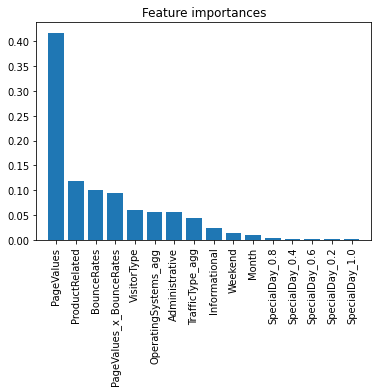

In [136]:
plt.title("Feature importances")
plt.bar(range(x_train.shape[1]),importances[indices])
plt.xticks(range(x_train.shape[1]), imp_sorted.index, rotation=90)
plt.xlim([-1, x_train.shape[1]])
plt.show()

In [141]:
df_new = df_temp.drop(['Informational', 'Weekend', 'Month', 'SpecialDay_0.8', 'SpecialDay_0.4', 'SpecialDay_0.6', 'SpecialDay_0.2', 'SpecialDay_1.0'],axis=1)

In [142]:
df_new

,Administrative,ProductRelated,BounceRates,PageValues,VisitorType,Revenue,OperatingSystems_agg,TrafficType_agg,PageValues_x_BounceRates
0,0,1,0.200000,0.000000,0.0,0,1.0,1.0,0.000000
1,0,2,0.000000,0.000000,0.0,0,0.0,0.0,0.000000
2,0,1,0.200000,0.000000,0.0,0,0.0,0.0,0.000000
3,0,2,0.050000,0.000000,0.0,0,0.0,0.0,0.000000
4,0,10,0.020000,0.000000,0.0,0,0.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...
12325,3,53,0.007143,12.241717,0.0,0,0.0,1.0,0.087441
12326,0,5,0.000000,0.000000,0.0,0,0.0,0.0,0.000000
12327,0,6,0.083333,0.000000,0.0,0,0.0,0.0,0.000000
12328,4,15,0.000000,0.000000,0.0,0,0.0,0.0,0.000000


In [143]:
X_new = df_new.drop(['Revenue'],axis=1)
y_new= df_new['Revenue']
cv = StratifiedShuffleSplit(n_splits=10, test_size=0.2, random_state=2)

In [145]:
clf = RandomForestClassifier(max_depth=5, random_state=2, n_estimators=750)

scores = cross_val_score(clf, X_new, y_new, cv=cv)
print("Average Accuracy of Classifier over 10-folds: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

Average Accuracy of Classifier over 10-folds: 0.89 (+/- 0.01)
